# Detecção de Fraudes com Árvore de Decisão

In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import skimpy

import sys

sys.path.append("../")

from src.scripts.report.info_dataset import list_dataset
from src.scripts.report.info_dataset import read_dataset
from src.scripts.report.info_dataset import infos_dataset

import warnings
warnings.filterwarnings("ignore")

## Verificação dos arquivos contidos no diretório especificado

In [6]:
file_path = '../raw_data/'

In [7]:
list_dataset(file_path)

Existem 3 arquivos contidos no diretorio: ../raw_data/


['file.json', 'file.xlsx', 'creditcard.csv']

## Criando o conjunto de dados de trabalho 

In [8]:
# A função ler arquivos csv, excel e json
df = read_dataset(file_path, 'creditcard.csv')
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


## Informações sobre o conjunto de dados

In [9]:
infos_dataset(df)

***********************************INFORMAÇÕES GERAIS SOBRE O CONJUNTO DE DADOS***********************************


5 primeiros registros do conjunto de dados


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


5 últimos registros do conjunto de dados


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0
284806,172792.0,-0.533413,-0.189733,0.703337,-0.506271,-0.012546,-0.649617,1.577006,-0.414650,0.486180,...,0.261057,0.643078,0.376777,0.008797,-0.473649,-0.818267,-0.002415,0.013649,217.00,0


O conjunto de dados possuí: 284807 linha e : 31 colunas.
**********************************************************************
O conjunto de dqados não possuí colunas categoricas!
**********************************************************************
As colunas numéricas são: 31
**********************************************************************
As colunas numéricas são: ['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount', 'Class']
**********************************************************************
A quantidade de valores nulos no conjunto de dados são: 0
**********************************************************************
A quantidade de linhas duplicadas é: 1081
            Time        V1        V2        V3        V4        V5        V6  \
33          26.0 -0.529912  0.873892  1.347247  0.145457  0.414209  0.100223   
35   

## Informações estatístícas

In [10]:
skimpy.skim(df)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 284807 │ │ float64     │ 30    │                                                          │
│ │ Number of columns │ 31     │ │ int64       │ 1     │                                                          │
│ └───────────────────┴────────┘ └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━┳━━━━━┳━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column_name   ┃ NA  ┃ NA %  ┃ mean       ┃ sd     ┃ p0    ┃ p25     ┃ p50      ┃ p75     ┃ p100   ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━━╇━━━━━╇━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━╇━━━━━━━━┩  │
│ │ Time          │   0 │     0 │      95000 │  47000 │     0 │   54000 │    85000 │  140000 │ 170000 │ ▂▇▇▂▇▇ │  │
│ │ V1            │   0 │     0 │    1.2e-15 │      2 │   -56 │   -0.92 │    0.018 │     1.3 │    2.5 │      ▇ │  │
│ │ V2            │   0 │     0 │    3.4e-16 │    1.7 │   -73 │    -0.6 │    0.065 │     0.8 │     22 │     ▇  │  │
│ │ V3            │   0 │     0 │   -1.4e-15 │    1.5 │   -48 │   -0.89 │     0.18 │       1 │    9.4 │     ▅▇ │  │
│ │ V4            │   0 │     0 │    2.1e-15 │    1.4 │  -5.7 │   -0.85 │    -0.02 │    0.74 │     17 │  ▁▇▁   │  │
│ │ V5            │   0 │     0 │    9.6e-16 │    1.4 │  -110 │   -0.69 │   -0.054 │    0.61 │     35 │     ▇  │  │
│ │ V6            │   0 │     0 │    1.5e-15 │    1.3 │   -26 │   -0.77 │    -0.27 │     0.4 │     73 │    ▇   │  │
│ │ V7            │   0 │     0 │   -5.6e-16 │    1.2 │   -44 │   -0.55 │     0.04 │    0.57 │    120 │    ▇   │  │
│ │ V8            │   0 │     0 │    1.2e-16 │    1.2 │   -73 │   -0.21 │    0.022 │    0.33 │     20 │     ▇  │  │
│ │ V9            │   0 │     0 │   -2.4e-15 │    1.1 │   -13 │   -0.64 │   -0.051 │     0.6 │     16 │    ▇▁  │  │
│ │ V10           │   0 │     0 │    2.2e-15 │    1.1 │   -25 │   -0.54 │   -0.093 │    0.45 │     24 │    ▃▇  │  │
│ │ V11           │   0 │     0 │    1.7e-15 │      1 │  -4.8 │   -0.76 │   -0.033 │    0.74 │     12 │   ▇▂   │  │
│ │ V12           │   0 │     0 │   -1.2e-15 │      1 │   -19 │   -0.41 │     0.14 │    0.62 │    7.8 │    ▁▇  │  │
│ │ V13           │   0 │     0 │    8.2e-16 │      1 │  -5.8 │   -0.65 │   -0.014 │    0.66 │    7.1 │   ▁▇▃  │  │
│ │ V14           │   0 │     0 │    1.2e-15 │   0.96 │   -19 │   -0.43 │    0.051 │    0.49 │     11 │    ▇▂  │  │
│ │ V15           │   0 │     0 │    4.9e-15 │   0.92 │  -4.5 │   -0.58 │    0.048 │    0.65 │    8.9 │   ▇▇   │  │
│ │ V16           │   0 │     0 │    1.4e-15 │   0.88 │   -14 │   -0.47 │    0.066 │    0.52 │     17 │    ▇   │  │
│ │ V17           │   0 │     0 │   -3.8e-16 │   0.85 │   -25 │   -0.48 │   -0.066 │     0.4 │    9.3 │     ▇  │  │
│ │ V18           │   0 │     0 │    9.6e-16 │   0.84 │  -9.5 │    -0.5 │  -0.0036 │     0.5 │      5 │    ▇▅  │  │
│ │ V19           │   0 │     0 │      1e-15 │   0.81 │  -7.2 │   -0.46 │   0.0037 │    0.46 │    5.6 │    ▁▇  │  │
│ │ V20           │   0 │     0 │    6.4e-16 │   0.77 │   -54 │   -0.21 │   -0.062 │    0.13 │     39 │     ▇  │  │
│ │ V21           │   0 │     0 │    1.7e-16 │   0.73 │   -35 │   -0.23 │   -0.029 │    0.19 │     27 │     ▇  │  │
│ │ V22           │   0 │     0 │   -3.6e-16 │   0.73 │ 

# Exploratory Data Analysis (EDA)

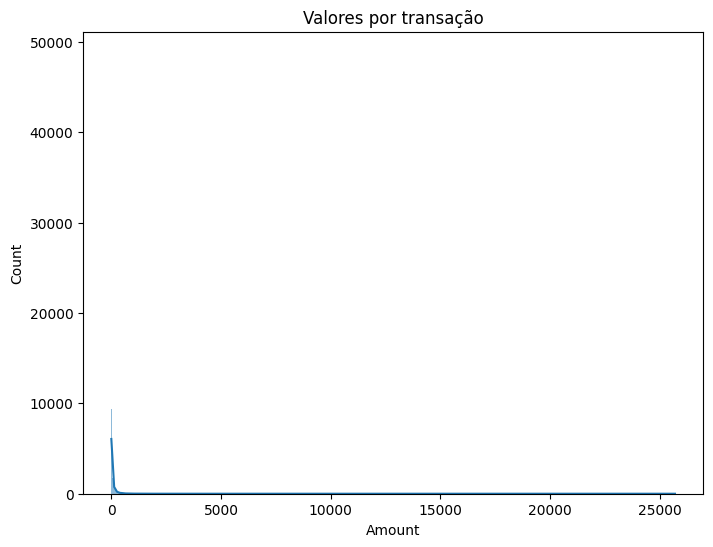

In [7]:
# Histograma
ax = sns.histplot(data=df, x='Amount', kde=True)
ax.figure.set_size_inches(8, 6)
ax.set_title('Valores por transação')
ax.set_xlabel('Amount');

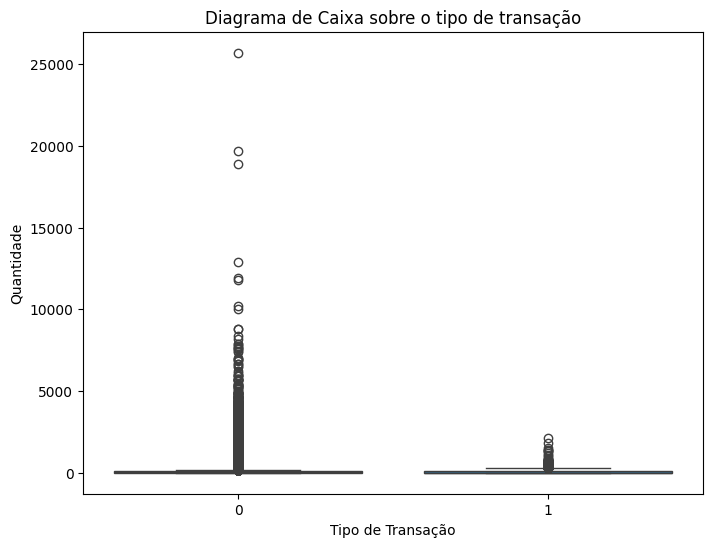

In [8]:
# Diagrama de caixa
plt.figure(figsize=(8, 6))
sns.boxplot(x='Class', y='Amount', data=df)
plt.title('Diagrama de Caixa sobre o tipo de transação')
plt.xlabel('Tipo de Transação')
plt.ylabel('Quantidade')
plt.show()

In [9]:
display(round(df['Class'].value_counts(normalize=True)*100, 2))
display(df['Class'].value_counts())

Class
0    99.83
1     0.17
Name: proportion, dtype: float64

Class
0    284315
1       492
Name: count, dtype: int64

## Machine Learning Template

In [16]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import ConfusionMatrixDisplay

In [15]:
# Como estamos lidando com conjutos de dados desbalanceados, podemos usar o StratifiedShuffleSplit
# Esse cara, separa 90% dos dados da classe majoritaria para treino 10% para teste, depois pega a classe minoritaria
# e faz a mesma coisa, separa 90% dos dados para treino 10% para teste

from sklearn.model_selection import StratifiedShuffleSplit 

In [11]:
def executar_validador(x, y):
    SEED = 0
    np.random.seed(SEED)
    validador = StratifiedShuffleSplit(n_splits=1, test_size=0.1)
    
    for treino_id, teste_id in validador.split(X, y):
        X_treino, X_teste = X[treino_id], X[teste_id]
        y_treino, y_teste = y[treino_id], y[teste_id]
    return X_treino, X_teste, y_treino, y_teste

In [12]:
%%time
from sklearn import tree 
from sklearn.tree import DecisionTreeClassifier
def executar_classificador(classificador, x_treino, y_treino, x_teste):
    classificador.fit(x_treino, y_treino)
    y_pred = classificador.predict(x_teste)
    
    return y_pred

CPU times: user 54 µs, sys: 10 µs, total: 64 µs
Wall time: 83.7 µs


In [13]:
def salvar_arvore(classificador):
  plt.figure(figsize=(200,100))
  tree.plot_tree(classificador, filled=True, fontsize=14)
  # plt.savefig(nome)
  # plt.close()
  plt.show()  

In [17]:
# Execução do validador
X = df.drop(columns='Class', axis=1).values
y = df['Class'].values
X_treino, X_teste, y_treino, y_teste = executar_validador(X, y)

In [32]:
# Execução do classificador
model_tree = DecisionTreeClassifier()
y_pred_arvore_decisao = executar_classificador(model_tree, X_treino, y_treino, X_teste)

In [30]:
#criacao da figura da arvore de decisao
salvar_arvore(model_tree)

In [31]:
from sklearn.metrics import accuracy_score

def validar_arvore(y_pred, y_test):
  print(accuracy_score(y_pred, y_test))

In [34]:
#validacao arvore de decisao
validar_arvore(y_pred_arvore_decisao, y_teste)

0.9990519995786665


In [36]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

def validar_arvore(y_test, y_pred):
    print(accuracy_score(y_pred, y_test))
    print(confusion_matrix(y_pred, y_test))

In [37]:
validar_arvore(y_pred_arvore_decisao, y_teste)

0.9990519995786665
[[28418    14]
 [   13    36]]


In [38]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score

def validar_arvore(y_test, y_pred):
  print(accuracy_score(y_pred, y_test))
  print(precision_score(y_pred, y_test))
  print(confusion_matrix(y_pred, y_test))

In [39]:
validar_arvore(y_pred_arvore_decisao, y_teste)

0.9990519995786665
0.72
[[28418    14]
 [   13    36]]


In [22]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

def validar_arvore(y_test, y_pred):
  print(accuracy_score(y_test, y_pred))
  print(precision_score(y_test, y_pred))
  print(recall_score(y_test, y_pred))
  print(confusion_matrix(y_test, y_pred))

In [45]:
validar_arvore(y_pred_arvore_decisao, y_teste)

0.9990519995786665
0.7346938775510204
0.72
[[28418    13]
 [   14    36]]


In [52]:
print(model_tree.get_params())

{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'random_state': None, 'splitter': 'best'}


In [49]:
print(model_tree.get_depth())

21


In [53]:
# Execução do classificador
model_tree = DecisionTreeClassifier(max_depth=10, random_state=0)
y_pred_arvore_decisao = executar_classificador(model_tree, X_treino, y_treino, X_teste)

In [56]:
validar_arvore(y_pred_arvore_decisao, y_teste)

0.9994733330992591
0.7346938775510204
0.9473684210526315
[[28430    13]
 [    2    36]]


In [57]:
# Execução do classificador
model_tree = DecisionTreeClassifier(max_depth=10, min_samples_leaf=10, random_state=0)
y_pred_arvore_decisao = executar_classificador(model_tree, X_treino, y_treino, X_teste)

In [58]:
validar_arvore(y_pred_arvore_decisao, y_teste)

0.9993679997191109
0.7551020408163265
0.8604651162790697
[[28426    12]
 [    6    37]]


In [59]:
# Execução do classificador
model_tree = DecisionTreeClassifier(max_depth=5, random_state=0)
y_pred_arvore_decisao = executar_classificador(model_tree, X_treino, y_treino, X_teste)

In [60]:
validar_arvore(y_pred_arvore_decisao, y_teste)

0.999403110845827
0.7142857142857143
0.9210526315789473
[[28429    14]
 [    3    35]]


## Bagging (Árvore de Decisão)

In [61]:
%%time
from sklearn.ensemble import RandomForestClassifier

classificador_random_forest = RandomForestClassifier(n_estimators=100, random_state=0)
y_pred_random_forest = executar_classificador(classificador_random_forest, X_treino, y_treino, X_teste)

CPU times: user 5min 31s, sys: 273 ms, total: 5min 32s
Wall time: 5min 34s


In [63]:
salvar_arvore(classificador_random_forest.estimators_[0])
salvar_arvore(classificador_random_forest.estimators_[1])

In [65]:
validar_arvore(y_teste, y_pred_random_forest)

0.9995084442259752
0.9487179487179487
0.7551020408163265
[[28430     2]
 [   12    37]]


In [71]:
%%time
from sklearn.ensemble import RandomForestClassifier

classificador_random_forest = RandomForestClassifier(n_estimators=50, random_state=0, max_depth=10)
y_pred_random_forest = executar_classificador(classificador_random_forest, X_treino, y_treino, X_teste)

CPU times: user 1min 48s, sys: 193 ms, total: 1min 48s
Wall time: 1min 50s


In [73]:
validar_arvore(y_teste, y_pred_random_forest)

0.9995435553526912
0.9736842105263158
0.7551020408163265
[[28431     1]
 [   12    37]]


In [18]:
%%time
from sklearn.ensemble import AdaBoostClassifier

classificador_adaboost = AdaBoostClassifier(random_state=0)
y_pred_adaboost = executar_classificador(classificador_adaboost, X_treino, y_treino, X_teste)

CPU times: user 1min 37s, sys: 75.3 ms, total: 1min 37s
Wall time: 1min 37s


In [19]:
salvar_arvore(classificador_adaboost.estimators_[0])
# salvar_arvore(classificador_adaboost.estimators_[1])

In [23]:
validar_arvore(y_teste, y_pred_adaboost)

0.9992626663389628
0.8888888888888888
0.6530612244897959
[[28428     4]
 [   17    32]]


In [25]:
%%time
from sklearn.ensemble import AdaBoostClassifier

classificador_adaboost = AdaBoostClassifier(random_state=0, n_estimators=100)
y_pred_adaboost = executar_classificador(classificador_adaboost, X_treino, y_treino, X_teste)

CPU times: user 3min 15s, sys: 100 ms, total: 3min 15s
Wall time: 3min 17s


In [ ]:
validar_arvore(y_teste, y_pred_adaboost)

In [ ]:
#funcao 'roda_modelo': ajuste a validacao

def roda_modelo(base_dados, classificador):

#separando a base de modelagem e variavel resposta

    y = base_dados['default']
    x = base_dados.drop(columns='default')

#separando a base de treino e teste

    SEED = 42
    treino_x, teste_x, treino_y, teste_y = train_test_split(x, y, test_size=0.30, random_state = SEED)

    base_treino = treino_x.shape[0]
    base_teste = teste_x.shape[0]
    print('A base de treino tem %s elementos e a base de teste tem %s elementos.' %(base_treino, base_teste))
    print(100*'-')

#ajustamdo modelo com base de teste
    
    modelo = classificador
    modelo.fit(treino_x, treino_y)

#-------------------------------------------------------------------------------------------------------------------------------------

#matriz de confusao

    matriz_confusao = plot_confusion_matrix(modelo, teste_x, teste_y, values_format = '.3g', cmap = 'Blues')
    plt.title('Matriz de Confusao')
    plt.show

#classification report

    previsoes = modelo.predict(teste_x)

    print('\nClassification Report:')
    print(classification_report(teste_y, previsoes))

#curva ROC  e AUC

    print(100*'-')
    prob_previsao = modelo.predict_proba(teste_x)[:,1]
   
    tfp, tvp, limite = roc_curve(teste_y, prob_previsao)
    print('roc_auc:', roc_auc_score(teste_y, prob_previsao))
    
    plt.subplots(1, figsize=(5,5))
    plt.title('Curva ROC')
    plt.plot(tfp, tvp)
    plt.plot([0, 1], ls="--", c = 'red') #plotando linha pontilhada guia para regressao aleatoria
    plt.plot([0, 0], [1, 0], ls="--", c = 'green'), plt.plot([1, 1], ls="--", c = 'green') #plotando linha pontilhada guia para regressao perfeita
    plt.ylabel('Sensibilidade')
    plt.xlabel('Especificidade')
    plt.show() 

    return modelo, matriz_confusao